# RAFT-Stereo

```
@inproceedings{lipson2021raft,
  title={RAFT-Stereo: Multilevel Recurrent Field Transforms for Stereo Matching},
  author={Lipson, Lahav and Teed, Zachary and Deng, Jia},
  booktitle={International Conference on 3D Vision (3DV)},
  year={2021}
}
```

Github Repo: https://github.com/princeton-vl/RAFT-Stereo

Paper: https://arxiv.org/pdf/2109.07547.pdf

## 1) Build the Conda Environment [~9 min]

In [3]:
# Install conda
!pip install -q condacolab
from shutil import which
import condacolab
if which("conda") is None:
  condacolab.install()

In [4]:
!git clone --recursive https://github.com/princeton-vl/RAFT-Stereo.git
%cd /content/RAFT-Stereo
!conda env create -f environment.yaml
print("\nThe runtime has restarted. To run steps 2-5, select the next cell and from the dropdown select Runtime -> Run after")

Cloning into 'RAFT-Stereo'...
remote: Enumerating objects: 87, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 87 (delta 40), reused 33 (delta 33), pack-reused 29 (from 1)
Receiving objects: 100% (87/87), 703.11 KiB | 15.98 MiB/s, done.
Resolving deltas: 100% (41/41), done.
/content/RAFT-Stereo

CondaValueError: prefix already exists: /usr/local/envs/raftstereo


The runtime has restarted. To run steps 2-5, select the next cell and from the dropdown select Runtime -> Run after


## 2) Download sample data [~1 min]

In [5]:
%cd /content/RAFT-Stereo
!pip install imageio # for visualization

# Download model weights and sample data
!bash download_datasets.sh
!bash download_models.sh

/content/RAFT-Stereo
--2025-12-07 16:22:54--  https://www.dropbox.com/s/fn8siy5muak3of3/official_train.txt
Resolving www.dropbox.com (www.dropbox.com)... 162.125.1.18, 2620:100:6016:18::a27d:112
Connecting to www.dropbox.com (www.dropbox.com)|162.125.1.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://www.dropbox.com/scl/fi/yrf6zw9ixy373pcml98o1/official_train.txt?rlkey=v1s0mj8dqf3943ft69wvz87sb [following]
--2025-12-07 16:22:54--  https://www.dropbox.com/scl/fi/yrf6zw9ixy373pcml98o1/official_train.txt?rlkey=v1s0mj8dqf3943ft69wvz87sb
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc3f0b11f4ac944c267ce77558bd.dl.dropboxusercontent.com/cd/0/inline/C2knZcsvJVngQx-6CXdqJEFnmvN7PjiFV_-sCXd5n1zCCTb6MELwUbUWdkvF5F_mhJB4rfDCKYBGgYyNbx9WZWwTeOyp2WnMfng8JnJL0krr1bXzhzVxxmHFFllbbZFgvNVCNScQX-HYsuQdexCPsFV6/file# [following]
--2025-12-07 16:22:54--  https://uc3f0b11f4ac944c267ce77558bd.

## 3) Run RAFT-Stereo

### You can replace the images and calibration with your own

In [6]:
%cd /content/RAFT-Stereo

# Upload images
from google.colab import files
from pathlib import Path
import numpy as np
import shutil

print("Upload LEFT image:")
uploaded_left = files.upload()
print("Upload RIGHT image:")
uploaded_right = files.upload()

left_img = list(uploaded_left.keys())[0]
right_img = list(uploaded_right.keys())[0]

# Create the folder structure demo.py expects
!mkdir -p datasets/my_stereo/my_scene
!cp {left_img} datasets/my_stereo/my_scene/im0.png
!cp {right_img} datasets/my_stereo/my_scene/im1.png

# Run with the proper path structure
!source activate raftstereo && python demo.py \
  --restore_ckpt models/raftstereo-middlebury.pth \
  --corr_implementation alt \
  --mixed_precision \
  -l=datasets/my_stereo/my_scene/im0.png \
  -r=datasets/my_stereo/my_scene/im1.png \
  --save_numpy

# Calibration
fx = 889.44722255
fy = 890.67612482
cx1 = 365.30215844
cy = 285.76081066
cx2 = 375.16051052
baseline = 320

# Output
!ls -la demo_output/

print(f"\nCalibration loaded. Baseline: {baseline} mm")

/content/RAFT-Stereo
Upload LEFT image:


Saving rgb0.png to rgb0 (1).png
Upload RIGHT image:


Saving rgb1.png to rgb1 (1).png
/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `cp rgb0 (1).png datasets/my_stereo/my_scene/im0.png'
/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `cp rgb1 (1).png datasets/my_stereo/my_scene/im1.png'
Found 1 images. Saving files to demo_output/
100% 1/1 [00:02<00:00,  2.45s/it]
total 1592
drwxr-xr-x 2 root root    4096 Dec  7 16:23 .
drwxr-xr-x 9 root root    4096 Dec  7 16:23 ..
-rw-r--r-- 1 root root 1555328 Dec  7 16:23 my_scene.npy
-rw-r--r-- 1 root root   62751 Dec  7 16:23 my_scene.png

Calibration loaded. Baseline: 320 mm


## 4) Create Point Cloud From Predicted Disparity



In [7]:
%cd /content/RAFT-Stereo

import sys
sys.path.append('core')

import torch
import numpy as np
from PIL import Image
from core.raft_stereo import RAFTStereo
from core.utils.utils import InputPadder
import torch.nn.functional as F

# Load model
model = torch.nn.DataParallel(RAFTStereo(args=type('Args', (), {
    'corr_implementation': 'alt',
    'mixed_precision': True,
    'shared_backbone': False,
    'corr_levels': 4,
    'corr_radius': 4,
    'n_downsample': 2,
    'context_norm': 'batch',
    'slow_fast_gru': False,
    'n_gru_layers': 3,
    'hidden_dims': [128]*3
})()), device_ids=[0])

model.load_state_dict(torch.load('models/raftstereo-middlebury.pth'))
model = model.module
model.to('cuda')
model.eval()

# Load your images directly (they're in the current directory)
image1 = np.array(Image.open('rgb0.png')).astype(np.uint8)
image2 = np.array(Image.open('rgb1.png')).astype(np.uint8)

# Preprocess
image1 = torch.from_numpy(image1).permute(2, 0, 1).float()[None].to('cuda')
image2 = torch.from_numpy(image2).permute(2, 0, 1).float()[None].to('cuda')

# Pad images
padder = InputPadder(image1.shape, divis_by=32)
image1, image2 = padder.pad(image1, image2)

# Run inference
with torch.no_grad():
    _, flow_up = model(image1, image2, iters=32, test_mode=True)

disparity = -flow_up.cpu().numpy().squeeze()

# Unpad
disparity = padder.unpad(torch.from_numpy(disparity[None, None]))[0, 0].numpy()

# Save
!mkdir -p demo_output
np.save('demo_output/rgb0.npy', disparity)
print(f"Saved disparity to demo_output/rgb0.npy")
print(f"Disparity shape: {disparity.shape}")
print(f"Disparity range: [{disparity.min():.2f}, {disparity.max():.2f}]")

/content/RAFT-Stereo


/content/RAFT-Stereo/core/raft_stereo.py:77: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.args.mixed_precision):
/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4317.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/content/RAFT-Stereo/core/raft_stereo.py:112: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast(enabled=self.args.mixed_precision):


Saved disparity to demo_output/rgb0.npy
Disparity shape: (540, 720)
Disparity range: [75.66, 280.69]


In [8]:
import plotly.graph_objects as go
import numpy as np
from imageio.v3 import imread

# Calibration
fx = 889.44722255
fy = 890.67612482
cx1 = 365.30215844
cy = 285.76081066
cx2 = 375.16051052
baseline = 320

# Load disparity and image
disp = np.load('demo_output/rgb0.npy')
image = imread('rgb0.png')

# inverse-project
depth = (fx * baseline) / (-disp + (cx2 - cx1))
H, W = depth.shape
xx, yy = np.meshgrid(np.arange(W), np.arange(H))
points_grid = np.stack(((xx-cx1)/fx, (yy-cy)/fy, np.ones_like(xx)), axis=0) * depth

mask = np.ones((H, W), dtype=bool)

# Remove flying points
mask[1:][np.abs(depth[1:] - depth[:-1]) > 1] = False
mask[:,1:][np.abs(depth[:,1:] - depth[:,:-1]) > 1] = False

points = points_grid.transpose(1,2,0)[mask]
colors = image[mask].astype(np.float64) / 255

print(f"Point cloud created with {points.shape[0]} points")

Point cloud created with 137193 points


## 5) Visualize 3D Point Cloud


In [9]:
NUM_POINTS_TO_DRAW = 100000

subset = np.random.choice(points.shape[0], size=(NUM_POINTS_TO_DRAW,), replace=False)
points_subset = points[subset]
colors_subset = colors[subset]

x, y, z = points_subset.T

fig = go.Figure(
    data=[
        go.Scatter3d(
            x=x, y=-z, z=-y, # flipped
            mode='markers',
            marker=dict(size=1, color=colors_subset)
        )
    ],
    layout=dict(
        scene=dict(
            xaxis=dict(visible=True),
            yaxis=dict(visible=True),
            zaxis=dict(visible=True),
        )
    )
)
fig.show()

In [10]:
disparity = np.load('demo_output/rgb0.npy')

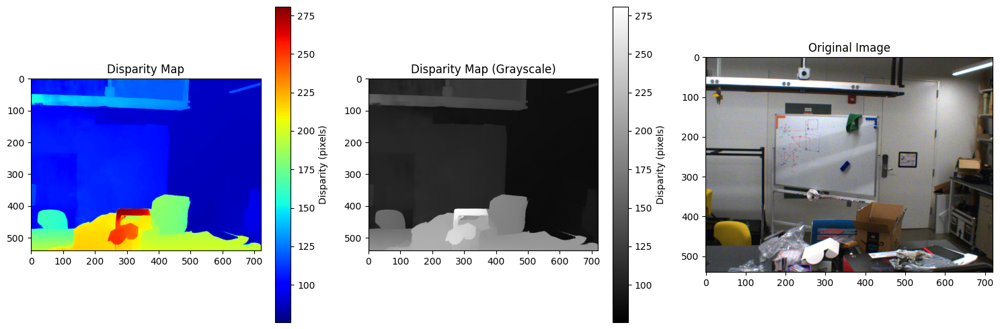

Disparity range: [75.66, 280.69] pixels


In [11]:
import matplotlib.pyplot as plt
# Visualize
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(disparity, cmap='jet')
plt.colorbar(label='Disparity (pixels)')
plt.title('Disparity Map')

plt.subplot(1, 3, 2)
plt.imshow(disparity, cmap='gray')
plt.colorbar(label='Disparity (pixels)')
plt.title('Disparity Map (Grayscale)')

plt.subplot(1, 3, 3)
# Show original image for comparison
image = plt.imread('rgb0.png')
plt.imshow(image)
plt.title('Original Image')

plt.tight_layout()
plt.show()

print(f"Disparity range: [{disparity.min():.2f}, {disparity.max():.2f}] pixels")

In [12]:
cx_offset = cx2 - cx1
adjusted_disparity = disparity - cx_offset

# Compute depth in millimeters
depth_mm = (baseline * fx) / adjusted_disparity

# Filter invalid depths
valid_mask = adjusted_disparity > 0.1  # Avoid division by very small numbers
depth_mm[~valid_mask] = 0  # or np.inf or np.nan

# Convert to meters
depth_m = depth_mm / 1000.0

# Save
np.save('demo_output/depth_rgb0.npy', depth_mm)

print(f"Depth computed!")
print(f"Valid depth range: [{depth_mm[valid_mask].min():.1f}, {depth_mm[valid_mask].max():.1f}] mm")
print(f"Valid depth range: [{depth_m[valid_mask].min():.3f}, {depth_m[valid_mask].max():.3f}] m")
import numpy as np

depth_m = np.load('demo_output/depth_rgb0.npy') / 1000.0
valid_depth = depth_m[(depth_m > 0) & (depth_m < 20)]

print(f"Average depth: {valid_depth.mean():.3f} m")
print(f"Min: {valid_depth.min():.3f} m | Max: {valid_depth.max():.3f} m | Median: {np.median(valid_depth):.3f} m")

Depth computed!
Valid depth range: [1050.9, 4325.4] mm
Valid depth range: [1.051, 4.325] m
Average depth: 2.915 m
Min: 1.051 m | Max: 4.325 m | Median: 2.989 m


In [13]:
!ls -la demo_output/depth_rgb0.npy

# Load it back to test
depth_loaded = np.load('demo_output/depth_rgb0.npy')
print(f"Depth map saved successfully")
print(f"  Shape: {depth_loaded.shape}")
print(f"  Size: {depth_loaded.nbytes / 1024 / 1024:.2f} MB")

-rw-r--r-- 1 root root 1555328 Dec  7 16:24 demo_output/depth_rgb0.npy
Depth map saved successfully
  Shape: (540, 720)
  Size: 1.48 MB


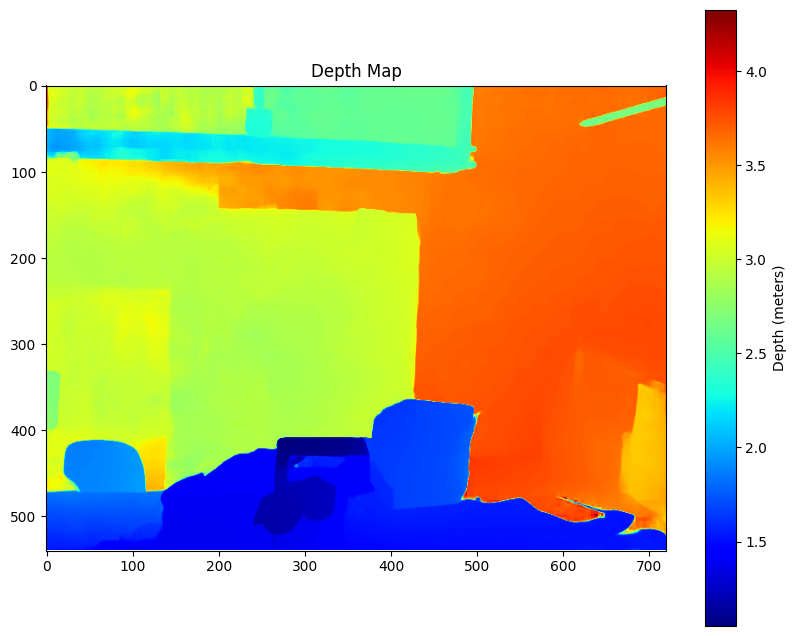

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Load depth map
depth_m = np.load('demo_output/depth_rgb0.npy') / 1000.0

# Simple visualization
plt.figure(figsize=(10, 8))
plt.imshow(depth_m, cmap='jet')
plt.colorbar(label='Depth (meters)')
plt.title('Depth Map')
plt.show()

##PnP - Extrinsic Calibration

In [19]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from google.colab import files

print(" CAMERA-IR EXTRINSIC CALIBRATION")

print("\nSTEP 1: Upload files\n")

print("1. Upload depth map (.npy or .npz):")
uploaded = files.upload()
depth_file = list(uploaded.keys())[0]

print("\n2. Upload matched features from ROMA (.npz):")
uploaded = files.upload()
matches_file = list(uploaded.keys())[0]

print("\nSTEP 2: Loading data\n")

# Load depth - handle both .npy and .npz
try:
    # Try loading as .npz first
    depth_data = np.load(depth_file)

    if isinstance(depth_data, np.lib.npyio.NpzFile):
        # It's an .npz file with keys
        print(f"Depth file keys: {list(depth_data.keys())}")

        if 'depth_m' in depth_data:
            depth_m = depth_data['depth_m']
        elif 'depth_mm' in depth_data:
            depth_m = depth_data['depth_mm'] / 1000.0
        elif 'depth' in depth_data:
            depth_m = depth_data['depth']
            if depth_m.max() > 100:
                depth_m = depth_m / 1000.0
        else:
            # Take first array
            depth_m = depth_data[list(depth_data.keys())[0]]
            if depth_m.max() > 100:
                depth_m = depth_m / 1000.0
    else:
        # It's a simple .npy array
        depth_m = depth_data
        if depth_m.max() > 100:  # If in mm
            depth_m = depth_m / 1000.0
        print(f"Loaded depth as simple array")

except:
    # Fallback: load as simple array
    depth_m = np.load(depth_file, allow_pickle=True)
    if depth_m.max() > 100:
        depth_m = depth_m / 1000.0
    print(f"Loaded depth as simple array")

print(f" Depth loaded: {depth_m.shape}")
print(f"   Depth range: {depth_m[depth_m>0].min():.3f}m to {depth_m[depth_m>0].max():.3f}m")

# Load matches
matches_data = np.load(matches_file)

if isinstance(matches_data, np.lib.npyio.NpzFile):
    print(f"\nMatches file keys: {list(matches_data.keys())}")

    # Try different key names
    if 'mkpts0' in matches_data and 'mkpts1' in matches_data:
        mkpts_rgb = matches_data['mkpts0']
        mkpts_ir = matches_data['mkpts1']
    elif 'mkpts_rgb' in matches_data and 'mkpts_ir' in matches_data:
        mkpts_rgb = matches_data['mkpts_rgb']
        mkpts_ir = matches_data['mkpts_ir']
    elif 'rgb_features' in matches_data and 'ir_features' in matches_data:
        mkpts_rgb = matches_data['rgb_features']
        mkpts_ir = matches_data['ir_features']
    elif 'keypoints0' in matches_data and 'keypoints1' in matches_data:
        mkpts_rgb = matches_data['keypoints0']
        mkpts_ir = matches_data['keypoints1']
    else:
        # Show available keys and use first two
        print("\nAvailable keys:")
        for key in matches_data.keys():
            print(f"   {key}: shape {matches_data[key].shape}")

        keys = list(matches_data.keys())
        mkpts_rgb = matches_data[keys[0]]
        mkpts_ir = matches_data[keys[1]]
        print(f"\n⚠️ Using: {keys[0]} as RGB, {keys[1]} as IR")
else:
    # It's a simple array - can't use this
    print("Matches file must be .npz with separate RGB and IR keypoints!")
    raise ValueError("Expected .npz file with matched keypoints")

print(f"\nMatched features loaded:")
print(f"   RGB points: {mkpts_rgb.shape}")
print(f"   IR points: {mkpts_ir.shape}")
print(f"   Number of matches: {len(mkpts_rgb)}")

# ========== STEP 3: CALIBRATION PARAMETERS ==========
print("\nSTEP 3: Camera calibration parameters\n")

# RGB Camera intrinsics
fx_rgb = 889.44722255
fy_rgb = 890.67612482
cx_rgb = 365.30215844
cy_rgb = 285.76081066

# IR Camera intrinsics
K_ir = np.array([
    [637.75776234, 0.0, 328.34835582],
    [0.0, 638.33548688, 253.27167231],
    [0.0, 0.0, 1.0]
], dtype=np.float64)

d_ir = np.array([-0.20450165, 0.14743368, 1.3691e-05, -0.00029961, 0.0], dtype=np.float64)

print(f"RGB camera: fx={fx_rgb:.2f}, fy={fy_rgb:.2f}")
print(f"IR camera: K shape={K_ir.shape}")

print("\nSTEP 4: Extracting 3D points from depth\n")

points_3d_camera = []
points_2d_ir_filtered = []
valid_indices = []

for i, (x, y) in enumerate(mkpts_rgb):
    x_int, y_int = int(round(x)), int(round(y))

    # Check bounds
    if not (0 <= x_int < depth_m.shape[1] and 0 <= y_int < depth_m.shape[0]):
        continue

    # Get depth at this feature location
    Z = depth_m[y_int, x_int]

    # Validate depth
    if not (0.3 < Z < 10.0):
        continue

    # Backproject 2D + depth - 3D in camera frame
    X = (x - cx_rgb) * Z / fx_rgb
    Y = (y - cy_rgb) * Z / fy_rgb

    points_3d_camera.append([X, Y, Z])
    points_2d_ir_filtered.append(mkpts_ir[i])
    valid_indices.append(i)

points_3d_camera = np.array(points_3d_camera, dtype=np.float64)
points_2d_ir_filtered = np.array(points_2d_ir_filtered, dtype=np.float64)

print(f"Valid 3D-2D correspondences: {len(points_3d_camera)} / {len(mkpts_rgb)}")
print(f"   Filtered out: {len(mkpts_rgb) - len(points_3d_camera)}")

if len(points_3d_camera) < 4:
    print("\nERROR: Need at least 4 valid correspondences for PnP!")
    print("   Filtered reasons:")

    # Diagnostics
    out_of_bounds = 0
    invalid_depth = 0
    for i, (x, y) in enumerate(mkpts_rgb):
        x_int, y_int = int(round(x)), int(round(y))
        if not (0 <= x_int < depth_m.shape[1] and 0 <= y_int < depth_m.shape[0]):
            out_of_bounds += 1
        else:
            Z = depth_m[y_int, x_int]
            if not (0.3 < Z < 10.0):
                invalid_depth += 1

    print(f"   - Out of bounds: {out_of_bounds}")
    print(f"   - Invalid depth: {invalid_depth}")

else:
    print(f"Sufficient correspondences for calibration")

#PnP
if len(points_3d_camera) >= 4:
    print("\nSTEP 5: Solving PnP with RANSAC\n")

    success, rvec, tvec, inliers = cv2.solvePnPRansac(
        objectPoints=points_3d_camera,
        imagePoints=points_2d_ir_filtered,
        cameraMatrix=K_ir,
        distCoeffs=d_ir,
        reprojectionError=5.0,
        confidence=0.99,
        flags=cv2.SOLVEPNP_ITERATIVE
    )

    if success:
        R_cam_to_ir, _ = cv2.Rodrigues(rvec)
        t_cam_to_ir = tvec.flatten()

        print("PnP SUCCESSFUL!\n")
        print(f"Inliers: {len(inliers)} / {len(points_3d_camera)} ({len(inliers)/len(points_3d_camera)*100:.1f}%)")

        print("\nSTEP 6: Refining calibration\n")

        inlier_idx = inliers.flatten()
        points_3d_inliers = points_3d_camera[inlier_idx]
        points_2d_inliers = points_2d_ir_filtered[inlier_idx]

        rvec_refined, tvec_refined = cv2.solvePnPRefineLM(
            objectPoints=points_3d_inliers,
            imagePoints=points_2d_inliers,
            cameraMatrix=K_ir,
            distCoeffs=d_ir,
            rvec=rvec,
            tvec=tvec
        )

        R_refined, _ = cv2.Rodrigues(rvec_refined)
        t_refined = tvec_refined.flatten()

        # Compute errors
        points_3d_ir = (R_refined @ points_3d_inliers.T).T + t_refined
        points_2d_proj, _ = cv2.projectPoints(
            points_3d_ir, np.zeros(3), np.zeros(3), K_ir, d_ir
        )
        errors = np.linalg.norm(points_2d_inliers - points_2d_proj.reshape(-1,2), axis=1)

        print("=" * 70)
        print(" CALIBRATION RESULTS")
        print("=" * 70)

        print(f"\nRotation Matrix (Camera → IR):")
        print(R_refined)

        print(f"\nTranslation Vector (Camera → IR) [meters]:")
        print(t_refined)
        print(f"   Magnitude: {np.linalg.norm(t_refined):.4f} m ({np.linalg.norm(t_refined)*1000:.2f} mm)")

        print(f"\nReprojection Error:")
        print(f"   Mean:   {errors.mean():.3f} pixels")
        print(f"   Median: {np.median(errors):.3f} pixels")
        print(f"   Max:    {errors.max():.3f} pixels")

        # Save
        np.savez('camera_ir_extrinsics_final.npz',
                 R=R_refined, t=t_refined,
                 rvec=rvec_refined, tvec=tvec_refined,
                 errors=errors, mean_error=errors.mean())

        print("\nSaved: camera_ir_extrinsics_final.npz")
        files.download('camera_ir_extrinsics_final.npz')

        print("\nCALIBRATION COMPLETE!")

    else:
        print("PnP failed")
else:
    print(f"Only {len(points_3d_camera)} valid correspondences (need ≥4)")

 CAMERA-IR EXTRINSIC CALIBRATION

STEP 1: Upload files

1. Upload depth map (.npy or .npz):


Saving depth_rgb0.npy to depth_rgb0 (1).npy

2. Upload matched features from ROMA (.npz):


Saving matches_roma_rgb_ir.npz to matches_roma_rgb_ir (1).npz

STEP 2: Loading data

Loaded depth as simple array
 Depth loaded: (540, 720)
   Depth range: 1.051m to 4.325m

Matches file keys: ['mkpts_rgb', 'mkpts_ir', 'mconf', 'img_paths']

Matched features loaded:
   RGB points: (800, 2)
   IR points: (800, 2)
   Number of matches: 800

STEP 3: Camera calibration parameters

RGB camera: fx=889.45, fy=890.68
IR camera: K shape=(3, 3)

STEP 4: Extracting 3D points from depth

Valid 3D-2D correspondences: 800 / 800
   Filtered out: 0
Sufficient correspondences for calibration

STEP 5: Solving PnP with RANSAC

PnP SUCCESSFUL!

Inliers: 765 / 800 (95.6%)

STEP 6: Refining calibration

 CALIBRATION RESULTS

Rotation Matrix (Camera → IR):
[[ 0.99992626  0.01090382  0.00534692]
 [-0.01118849  0.99834179  0.05646678]
 [-0.00472235 -0.05652244  0.99839016]]

Translation Vector (Camera → IR) [meters]:
[ 0.04054672 -0.14774771  0.68279225]
   Magnitude: 0.6998 m (699.77 mm)

Reprojection Error:


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


CALIBRATION COMPLETE!



Upload RGB image:


Saving rgb0.png to rgb0 (4).png

Upload IR image:


Saving ir0.png to ir0 (2).png


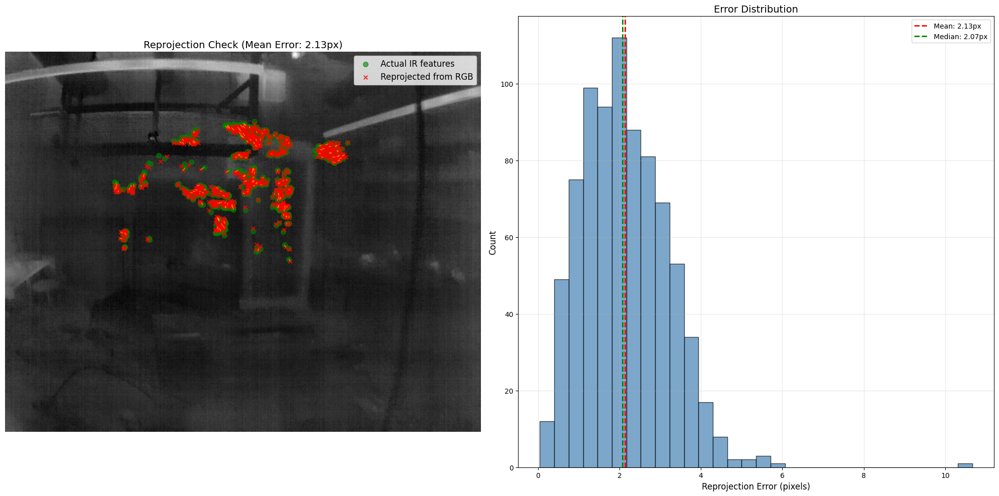


Reprojection completed!
   Total points validated: 800
   Mean error: 2.134 px
   Median error: 2.072 px
   Max error: 10.665 px
   RMS error: 2.379 px


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
# Load data
print("\nUpload RGB image:")
uploaded = files.upload()
rgb_img = cv2.imread(list(uploaded.keys())[0])

print("\nUpload IR image:")
uploaded = files.upload()
ir_img = cv2.imread(list(uploaded.keys())[0])

# Load matches and depth
matches_data = np.load('matches_roma_rgb_ir (1).npz')
mkpts_rgb = matches_data['mkpts_rgb']
mkpts_ir = matches_data['mkpts_ir']

depth_m = np.load('depth_rgb0 (1).npy')
if depth_m.max() > 100:
    depth_m = depth_m / 1000.0

# Extrinsic calibration
R = np.array([[ 0.99992626,  0.01090382,  0.00534692],
              [-0.01118849,  0.99834179,  0.05646678],
              [-0.00472235, -0.05652244,  0.99839016]])
t = np.array([0.04054672, -0.14774771, 0.68279225])

fx_rgb, fy_rgb = 889.44722255, 890.67612482
cx_rgb, cy_rgb = 365.30215844, 285.76081066

K_ir = np.array([[637.75776234, 0, 328.34835582],
                 [0, 638.33548688, 253.27167231],
                 [0, 0, 1]])

d_ir = np.array([-0.20450165, 0.14743368, 1.3691e-05, -0.00029961, 0.0])

# Backproject RGB features to 3D
points_3d = []
valid_rgb_pts = []
valid_ir_pts = []

for i, (x, y) in enumerate(mkpts_rgb):
    xi, yi = int(round(x)), int(round(y))
    if not (0 <= xi < depth_m.shape[1] and 0 <= yi < depth_m.shape[0]):
        continue

    Z = depth_m[yi, xi]
    if not (0.3 < Z < 10.0):
        continue

    X = (x - cx_rgb) * Z / fx_rgb
    Y = (y - cy_rgb) * Z / fy_rgb

    points_3d.append([X, Y, Z])
    valid_rgb_pts.append([x, y])
    valid_ir_pts.append(mkpts_ir[i])

points_3d = np.array(points_3d)
valid_rgb_pts = np.array(valid_rgb_pts)
valid_ir_pts = np.array(valid_ir_pts)

# Transform to IR frame
points_3d_ir = (R @ points_3d.T).T + t

# Project to IR image
points_2d_projected, _ = cv2.projectPoints(
    points_3d_ir, np.zeros(3), np.zeros(3), K_ir, d_ir
)
points_2d_projected = points_2d_projected.reshape(-1, 2)

# Compute errors
errors = np.linalg.norm(valid_ir_pts - points_2d_projected, axis=1)

# Visualize
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot on IR image
axes[0].imshow(cv2.cvtColor(ir_img, cv2.COLOR_BGR2RGB))
axes[0].scatter(valid_ir_pts[:, 0], valid_ir_pts[:, 1],
                c='green', s=50, marker='o', alpha=0.6, label='Actual IR features')
axes[0].scatter(points_2d_projected[:, 0], points_2d_projected[:, 1],
                c='red', s=30, marker='x', alpha=0.8, label='Reprojected from RGB')

# Error lines for every 5th point
for i in range(0, len(valid_ir_pts), 5):
    axes[0].plot([valid_ir_pts[i, 0], points_2d_projected[i, 0]],
                 [valid_ir_pts[i, 1], points_2d_projected[i, 1]],
                 'yellow', linewidth=1, alpha=0.5)

axes[0].legend(fontsize=12)
axes[0].set_title(f'Reprojection Check (Mean Error: {errors.mean():.2f}px)', fontsize=14)
axes[0].axis('off')

# Error distribution
axes[1].hist(errors, bins=30, edgecolor='black', alpha=0.7, color='steelblue')
axes[1].axvline(errors.mean(), color='r', linestyle='--', linewidth=2,
                label=f'Mean: {errors.mean():.2f}px')
axes[1].axvline(np.median(errors), color='g', linestyle='--', linewidth=2,
                label=f'Median: {np.median(errors):.2f}px')
axes[1].set_xlabel('Reprojection Error (pixels)', fontsize=12)
axes[1].set_ylabel('Count', fontsize=12)
axes[1].set_title('Error Distribution', fontsize=14)
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('validation_reprojection.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nReprojection completed!")
print(f"   Total points validated: {len(errors)}")
print(f"   Mean error: {errors.mean():.3f} px")
print(f"   Median error: {np.median(errors):.3f} px")
print(f"   Max error: {errors.max():.3f} px")
print(f"   RMS error: {np.sqrt((errors**2).mean()):.3f} px")

files.download('validation_reprojection.png')